In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

## Loading the data set

In [2]:
df = pd.read_csv('../data/raw/MY2020_Fuel_Consumption_Ratings.csv', encoding="unicode-escape")
df

,Model,Make,Model.1,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel Consumption,Unnamed: 9,Unnamed: 10,Unnamed: 11,CO2 Emissions,CO2,Smog
0,Year,NaN,NaN,NaN,(L),NaN,NaN,Type,City (L/100 km),Hwy (L/100 km),Comb (L/100 km),Comb (mpg),(g/km),Rating,Rating
1,2020,Acura,ILX,Compact,2.4,4.0,AM8,Z,9.9,7,8.6,33,199,6,3
2,2020,Acura,MDX SH-AWD,SUV: Small,3.5,6.0,AS9,Z,12.3,9.2,10.9,26,254,4,3
3,2020,Acura,MDX SH-AWD A-SPEC,SUV: Small,3.5,6.0,AS9,Z,12.2,9.5,11,26,258,4,3
4,2020,Acura,MDX Hybrid AWD,SUV: Small,3,6.0,AM7,Z,9.1,9,9,31,210,5,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
911,NaN,N = natural gas,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
912,Fuel consumption,City and highway fuel consumption ratings are ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
913,CO2 emissions,the tailpipe emissions of carbon dioxide (in g...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
914,CO2 rating,the tailpipe emissions of carbon dioxide rated...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Understanding the Table: 

**Model**
- 4WD/4X4 = Four-wheel drive
- AWD = All-wheel drive
- FFV = Flexible-fuel vehicle
- SWB = Short wheelbase
- LWB = Long wheelbase
- EWB = Extended wheelbase

**Engine Size**

- Size of the engine is given in Litres (L)

**Transmission**
- A = automatic
- AM = automated manual
- AS = automatic with select shift
- AV = continuously variable
- M = manual
- 3 – 10 = Number of gears

**Fuel type**
- X = regular gasoline
- Z = premium gasoline
- D = diesel
- E = ethanol (E85)
- N = natural gas


**Fuel consumption**
- City and highway fuel consumption ratings are shown in litres per 100 kilometres (L/100 km) - the combined rating (55% city, 45% hwy) is shown in L/100 km and in miles per imperial gallon (mpg).

**CO2 emissions**
- The tailpipe emissions of carbon dioxide (in grams per kilometre) for combined city and highway driving.

**CO2 rating**
- The tailpipe emissions of carbon dioxide rated on a scale from 1 (worst) to 10 (best).

**Smog rating**
- The tailpipe emissions of smog-forming pollutants rated on a scale from 1 (worst) to 10 (best).

In [3]:
df.head()

,Model,Make,Model.1,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel Consumption,Unnamed: 9,Unnamed: 10,Unnamed: 11,CO2 Emissions,CO2,Smog
0,Year,NaN,NaN,NaN,(L),NaN,NaN,Type,City (L/100 km),Hwy (L/100 km),Comb (L/100 km),Comb (mpg),(g/km),Rating,Rating
1,2020,Acura,ILX,Compact,2.4,4.0,AM8,Z,9.9,7,8.6,33,199,6,3
2,2020,Acura,MDX SH-AWD,SUV: Small,3.5,6.0,AS9,Z,12.3,9.2,10.9,26,254,4,3
3,2020,Acura,MDX SH-AWD A-SPEC,SUV: Small,3.5,6.0,AS9,Z,12.2,9.5,11,26,258,4,3
4,2020,Acura,MDX Hybrid AWD,SUV: Small,3,6.0,AM7,Z,9.1,9,9,31,210,5,3


In [4]:
df.tail()

,Model,Make,Model.1,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel Consumption,Unnamed: 9,Unnamed: 10,Unnamed: 11,CO2 Emissions,CO2,Smog
911,NaN,N = natural gas,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
912,Fuel consumption,City and highway fuel consumption ratings are ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
913,CO2 emissions,the tailpipe emissions of carbon dioxide (in g...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
914,CO2 rating,the tailpipe emissions of carbon dioxide rated...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
915,Smog rating,the tailpipe emissions of smog-forming polluta...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Using .describe() to explore the data set. 

In [5]:
df.describe(include=['object']).T

,count,unique,top,freq
Model,901,10,2020,892
Make,913,60,BMW,76
Model.1,892,664,Sierra 4WD,7
Vehicle Class,892,15,SUV: Small,179
Engine Size,893,42,2,211
Transmission,892,24,AS8,229
Fuel,893,5,X,443
Fuel Consumption,893,150,16,17
Unnamed: 9,893,109,8.3,28
Unnamed: 10,893,135,9.4,22


In [6]:
df.describe()

,Cylinders
count,892.000000
mean,5.672646
std,1.933349
min,3.000000
25%,4.000000
50%,6.000000
75%,6.000000
max,16.000000


## Cleaning and Wrangling the dataset 

As seen from above the data types of the columns need to be adjusted to perform further analysis. Currently, we are not getting any usable information. Also, some columns should be dropped, column names and formats need to be changed.

- We do not need the fuel consumption in miles per gallon (mpg). Hence, it can be dropped. 

In [7]:
df1 = df.drop('Unnamed: 11', axis = 1)
df1= df1.drop(df1.index[0])
df1

,Model,Make,Model.1,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel Consumption,Unnamed: 9,Unnamed: 10,CO2 Emissions,CO2,Smog
1,2020,Acura,ILX,Compact,2.4,4.0,AM8,Z,9.9,7,8.6,199,6,3
2,2020,Acura,MDX SH-AWD,SUV: Small,3.5,6.0,AS9,Z,12.3,9.2,10.9,254,4,3
3,2020,Acura,MDX SH-AWD A-SPEC,SUV: Small,3.5,6.0,AS9,Z,12.2,9.5,11,258,4,3
4,2020,Acura,MDX Hybrid AWD,SUV: Small,3,6.0,AM7,Z,9.1,9,9,210,5,3
5,2020,Acura,RDX AWD,SUV: Small,2,4.0,AS10,Z,11,8.6,9.9,232,5,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
911,NaN,N = natural gas,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
912,Fuel consumption,City and highway fuel consumption ratings are ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
913,CO2 emissions,the tailpipe emissions of carbon dioxide (in g...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
914,CO2 rating,the tailpipe emissions of carbon dioxide rated...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- The column names need to be adjusted to make the data more readable.

In [8]:
df1 = df1.rename(columns = {'Model' : 'Model_Year', 'Model.1' : 'Model_Name', 'Fuel Consumption' : 'Fuel_Consumption_City', 'Unnamed: 9' : 'Fuel_Consumption_Hwy', 'Unnamed: 9' : 'Fuel_Consumption_Hwy', 'Unnamed: 10' : 'Fuel_Consumption_Comb', 'CO2' : 'CO2_Rating', 'Smog': 'Smog_Rating'})
df1

,Model_Year,Make,Model_Name,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
1,2020,Acura,ILX,Compact,2.4,4.0,AM8,Z,9.9,7,8.6,199,6,3
2,2020,Acura,MDX SH-AWD,SUV: Small,3.5,6.0,AS9,Z,12.3,9.2,10.9,254,4,3
3,2020,Acura,MDX SH-AWD A-SPEC,SUV: Small,3.5,6.0,AS9,Z,12.2,9.5,11,258,4,3
4,2020,Acura,MDX Hybrid AWD,SUV: Small,3,6.0,AM7,Z,9.1,9,9,210,5,3
5,2020,Acura,RDX AWD,SUV: Small,2,4.0,AS10,Z,11,8.6,9.9,232,5,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
911,NaN,N = natural gas,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
912,Fuel consumption,City and highway fuel consumption ratings are ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
913,CO2 emissions,the tailpipe emissions of carbon dioxide (in g...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
914,CO2 rating,the tailpipe emissions of carbon dioxide rated...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- Resetting the index and dropping the index column. 

In [9]:
df1 = df1.dropna(axis = 0).reset_index()
df1 = df1.drop('index', axis = 1)
df1

,Model_Year,Make,Model_Name,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
0,2020,Acura,ILX,Compact,2.4,4.0,AM8,Z,9.9,7,8.6,199,6,3
1,2020,Acura,MDX SH-AWD,SUV: Small,3.5,6.0,AS9,Z,12.3,9.2,10.9,254,4,3
2,2020,Acura,MDX SH-AWD A-SPEC,SUV: Small,3.5,6.0,AS9,Z,12.2,9.5,11,258,4,3
3,2020,Acura,MDX Hybrid AWD,SUV: Small,3,6.0,AM7,Z,9.1,9,9,210,5,3
4,2020,Acura,RDX AWD,SUV: Small,2,4.0,AS10,Z,11,8.6,9.9,232,5,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
887,2020,Volvo,XC40 T5 AWD,SUV: Small,2,4.0,AS8,Z,10.7,7.7,9.4,219,5,5
888,2020,Volvo,XC60 T5 AWD,SUV: Small,2,4.0,AS8,Z,11.2,8.3,9.9,232,5,5
889,2020,Volvo,XC60 T6 AWD,SUV: Small,2,4.0,AS8,Z,11.7,8.6,10.3,240,5,7
890,2020,Volvo,XC90 T5 AWD,SUV: Standard,2,4.0,AS8,Z,11.2,8.3,9.9,232,5,5


- Changing the datatype of the columns to seperate categorical and numerical types.

In [10]:
df1['Engine Size'] = df1['Engine Size'].astype('float64')
df1['Fuel_Consumption_City'] = df1['Fuel_Consumption_City'].astype('float64')
df1['Fuel_Consumption_Hwy'] = df1['Fuel_Consumption_Hwy'].astype('float64')
df1['Fuel_Consumption_Comb'] = df1['Fuel_Consumption_Comb'].astype('float64')
df1['CO2 Emissions'] = df1['CO2 Emissions'].astype('float64')
df1['CO2_Rating'] = df1['CO2_Rating'].astype('int64')
df1['Smog_Rating'] = df1['Smog_Rating'].astype('int64')
df1.dtypes

Model_Year                object
Make                      object
Model_Name                object
Vehicle Class             object
Engine Size              float64
Cylinders                float64
Transmission              object
Fuel                      object
Fuel_Consumption_City    float64
Fuel_Consumption_Hwy     float64
Fuel_Consumption_Comb    float64
CO2 Emissions            float64
CO2_Rating                 int64
Smog_Rating                int64
dtype: object

### Saving the processed data to a *.csv* file in the given path.

In [11]:
df1.to_csv(r'C:\Users\amaiya09\Data301\Project\course-project-solo_310\data\processed\data.csv', index = False)

## Method Chaining

In [12]:
from script import project_functions
df2 = project_functions.load_and_process('../data/raw/MY2020_Fuel_Consumption_Ratings.csv')
df2

,Model_Year,Make,Model_Name,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
0,2020,Acura,ILX,Compact,2.4,4.0,AM8,Z,9.9,7,8.6,199,6,3
1,2020,Acura,MDX SH-AWD,SUV: Small,3.5,6.0,AS9,Z,12.3,9.2,10.9,254,4,3
2,2020,Acura,MDX SH-AWD A-SPEC,SUV: Small,3.5,6.0,AS9,Z,12.2,9.5,11,258,4,3
3,2020,Acura,MDX Hybrid AWD,SUV: Small,3,6.0,AM7,Z,9.1,9,9,210,5,3
4,2020,Acura,RDX AWD,SUV: Small,2,4.0,AS10,Z,11,8.6,9.9,232,5,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
887,2020,Volvo,XC40 T5 AWD,SUV: Small,2,4.0,AS8,Z,10.7,7.7,9.4,219,5,5
888,2020,Volvo,XC60 T5 AWD,SUV: Small,2,4.0,AS8,Z,11.2,8.3,9.9,232,5,5
889,2020,Volvo,XC60 T6 AWD,SUV: Small,2,4.0,AS8,Z,11.7,8.6,10.3,240,5,7
890,2020,Volvo,XC90 T5 AWD,SUV: Standard,2,4.0,AS8,Z,11.2,8.3,9.9,232,5,5


 ## Exploratory Data Analysis (EDA) 

- Using `.describe()` to get an overview of the dataset.

In [13]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
Engine Size,892.0,3.172085,1.369909,1.0,2.0,3.0,3.8,8.0
Cylinders,892.0,5.672646,1.933349,3.0,4.0,6.0,6.0,16.0
Fuel_Consumption_City,892.0,12.389798,3.440659,4.2,10.1,12.0,14.4,27.2
Fuel_Consumption_Hwy,892.0,9.092937,2.134019,4.0,7.6,8.8,10.3,18.1
Fuel_Consumption_Comb,892.0,10.905045,2.813649,4.1,9.0,10.6,12.6,23.0
CO2 Emissions,892.0,253.061659,60.651158,96.0,210.0,250.0,291.5,537.0
CO2_Rating,892.0,4.532511,1.721345,1.0,3.0,4.0,5.0,10.0
Smog_Rating,892.0,4.501121,1.754583,1.0,3.0,5.0,6.0,7.0


In [14]:
df1.describe(include = object).T

,count,unique,top,freq
Model_Year,892,1,2020,892
Make,892,39,BMW,76
Model_Name,892,664,Sierra 4WD,7
Vehicle Class,892,15,SUV: Small,179
Transmission,892,24,AS8,229
Fuel,892,4,X,443


- Checking the datatypes in the dataset.

In [15]:
df1.dtypes

Model_Year                object
Make                      object
Model_Name                object
Vehicle Class             object
Engine Size              float64
Cylinders                float64
Transmission              object
Fuel                      object
Fuel_Consumption_City    float64
Fuel_Consumption_Hwy     float64
Fuel_Consumption_Comb    float64
CO2 Emissions            float64
CO2_Rating                 int64
Smog_Rating                int64
dtype: object

- Using pandas_profiling to draw insights from the data set.

In [16]:
from pandas_profiling import ProfileReport

prof = ProfileReport(df1)
prof

**From the profiling report, the following observations can be made:**

1. The fuel consumption varies across various makes and model types.
2. CO2 emissions follow a similar trend as fuel consumption.
3. Most vehicles use gasoline followed by diesel. 
4. AS8 is the most common transmission type in the vehicles. 

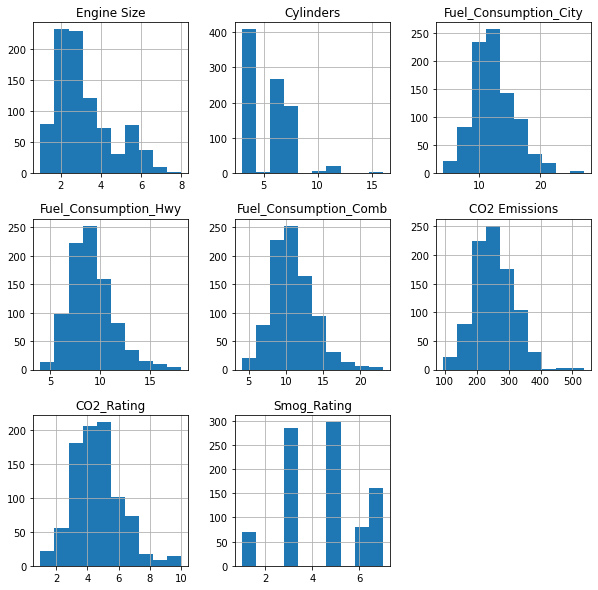

In [17]:
hist = df1.hist(bins=10,figsize =(10,10))

In [18]:
df1['Make'].value_counts()

BMW              76
Chevrolet        71
Ford             68
GMC              51
Toyota           49
Audi             38
Mercedes-Benz    37
Honda            35
Jeep             35
Hyundai          32
Nissan           30
Mazda            28
Lexus            26
Dodge            24
Jaguar           23
Kia              22
Porsche          21
Land Rover       21
Cadillac         21
Subaru           18
Volkswagen       14
Ram              14
MINI             14
Volvo            12
Buick            11
Lincoln          11
Acura            10
Maserati         10
Genesis           8
Mitsubishi        8
Bentley           8
Rolls-Royce       8
Infiniti          7
Alfa Romeo        7
Lamborghini       7
Chrysler          6
Aston Martin      5
FIAT              4
Bugatti           2
Name: Make, dtype: int64

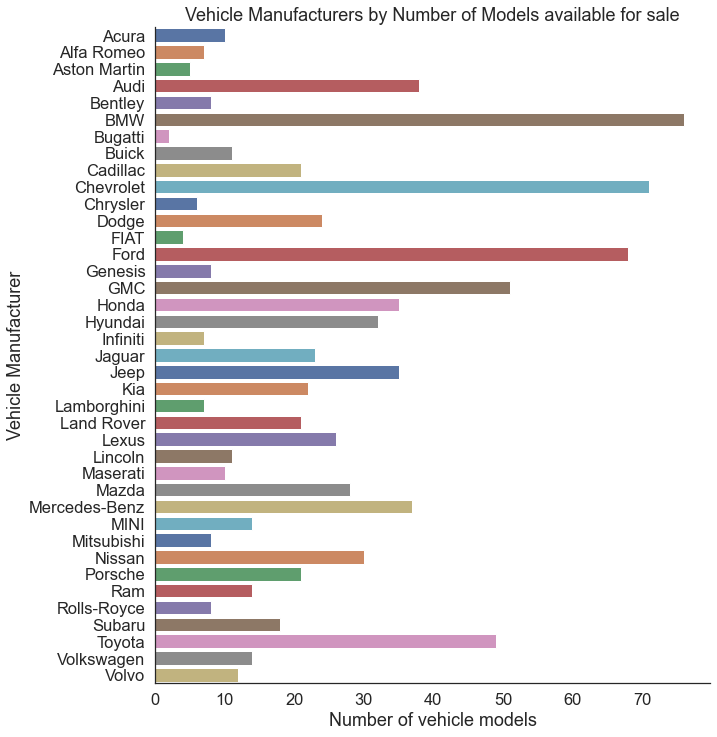

In [19]:
sns.set_theme(font_scale = 1.5, style="white")
sns.catplot(y='Make', data = df1, kind = 'count', aspect =1, palette = 'deep', height=10)\
.set(title = 'Vehicle Manufacturers by Number of Models available for sale' , xlabel = "Number of vehicle models", ylabel = "Vehicle Manufacturer")



From the above plot it can be seen that *BMW* has the most number of vehicle models avilable for sale in Canada in 2020. Followed by *Chevrolet* and *Ford*. 

(array([  0.,  25.,  50.,  75., 100., 125., 150., 175., 200.]),
 [Text(0.0, 0, '0'),
  Text(25.0, 0, '25'),
  Text(50.0, 0, '50'),
  Text(75.0, 0, '75'),
  Text(100.0, 0, '100'),
  Text(125.0, 0, '125'),
  Text(150.0, 0, '150'),
  Text(175.0, 0, '175'),
  Text(200.0, 0, '200')])

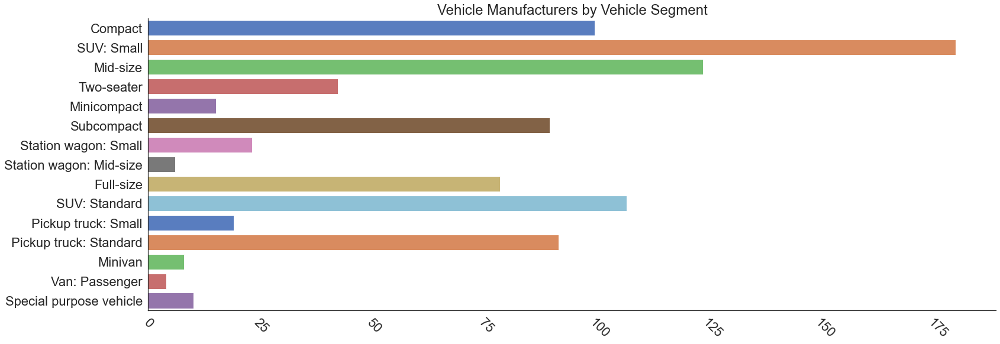

In [20]:
sns.set_theme(font_scale = 2, style="white")
sns.catplot(y='Vehicle Class', data = df1, kind = 'count', aspect =3, height = 8, palette = 'muted')\
.set(title = 'Vehicle Manufacturers by Vehicle Segment' , xlabel = "", ylabel = "")
plt.xticks(rotation=-45)

Most of the car models available in Canada are in the *SUV: Small* segment followed by the *Mid-size* segment. 

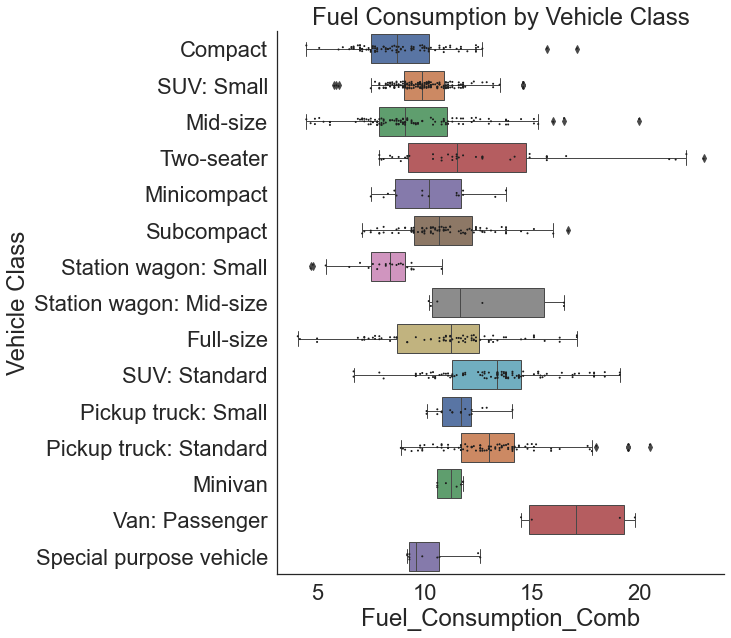

In [21]:
sns.set_theme(font_scale = 2, style="white")
fig_dims = (8, 10)
fig, ax = plt.subplots(figsize=fig_dims)
ax = sns.boxplot(x = df1['Fuel_Consumption_Comb'], y = df1['Vehicle Class'] , linewidth = 1, palette = 'deep')
ax.set(xlabel = 'Combined Fuel Consumption (L/100 km)', ylabel = '', title = 'Fuel Consumption by Vehicle Class', xticks = np.arange(0, 35,step = 5))
ax = sns.stripplot(x = df1['Fuel_Consumption_Comb'], y = df1['Vehicle Class'], linewidth = 1, color = '.2', size = 1)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

- In the two-seater class; there is a wide range of Fuel Consumption. This may be due to sports cars; which have large engines for high power and performance. 
- Passenger vans have an extraordinarily high fuel consumption amongst all the other segments. 

In [22]:
df1. corr()

,Engine Size,Cylinders,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
Engine Size,1.000000,0.922293,0.842362,0.762736,0.826672,0.841139,-0.770252,-0.511118
Cylinders,0.922293,1.000000,0.832307,0.741750,0.812608,0.836325,-0.755935,-0.527937
Fuel_Consumption_City,0.842362,0.832307,1.000000,0.938795,0.992994,0.953119,-0.910016,-0.542963
Fuel_Consumption_Hwy,0.762736,0.741750,0.938795,1.000000,0.972568,0.915288,-0.871849,-0.469052
Fuel_Consumption_Comb,0.826672,0.812608,0.992994,0.972568,1.000000,0.953534,-0.909869,-0.525080
CO2 Emissions,0.841139,0.836325,0.953119,0.915288,0.953534,1.000000,-0.954618,-0.551768
CO2_Rating,-0.770252,-0.755935,-0.910016,-0.871849,-0.909869,-0.954618,1.000000,0.525808
Smog_Rating,-0.511118,-0.527937,-0.542963,-0.469052,-0.525080,-0.551768,0.525808,1.000000


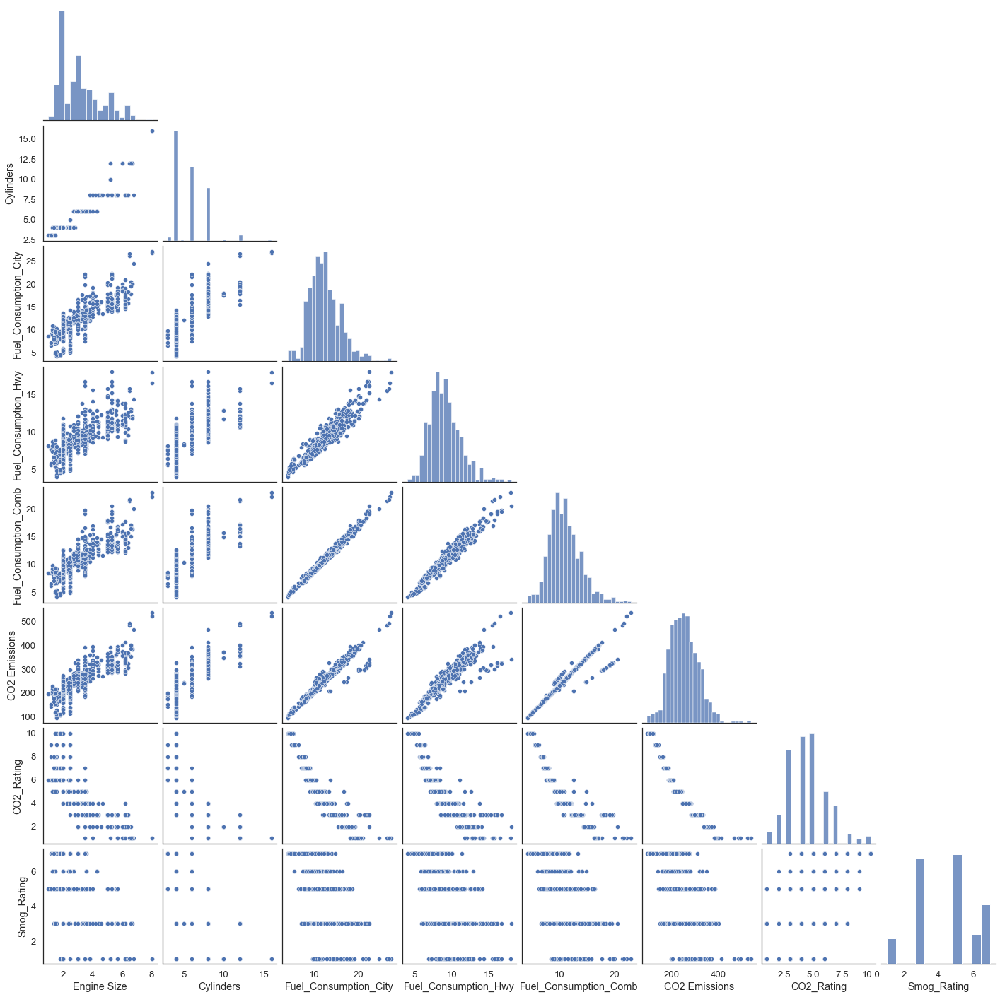

In [23]:
sns.set_theme(font_scale = 1.2, style="white")
sns.pairplot(df1, corner = True)

**It can be seen from the above pair plot that:**
- There maybe some correlation betweeen the *engine size* and *fuel consumption*. 
- The *fuel consumption* increases with an increase in the number of *cylinders*.
- The CO2 rating shows a negative correlation with Fuel Consumption.

However, the above statements need to be validated.

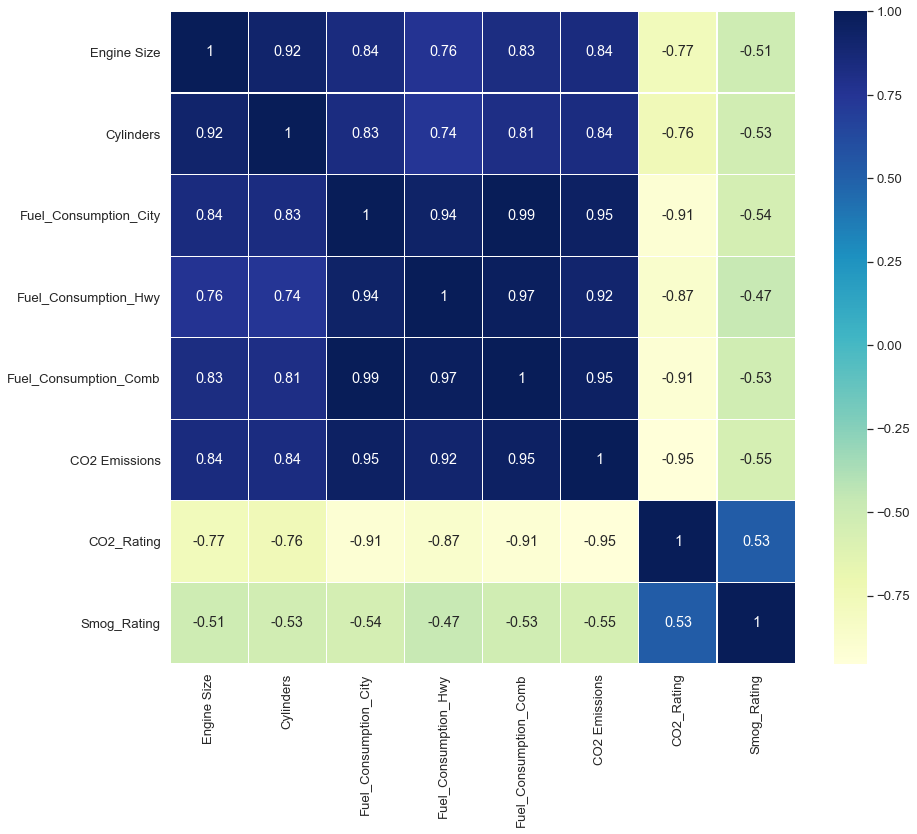

In [24]:
plt.figure(figsize=(14,12))

sns.heatmap(df1.corr(),linewidths=.1,cmap="YlGnBu", annot=True)

plt.yticks(rotation=0);

**Takeaways:**
- Combined Fuel Consumption is calculated by weighting the City and Highway Fuel Consumption. Hence, it shows a positive correlation with its influencing factors. 
- The CO2 rating has a negative correlation with Fuel Consumption and CO2 Emissions.
- Smog rating does not show any correlation with the variables in the dataset. 
- CO2 emissions shows a positive correlation with the Fuel Consumption.

## Analysis

### 1. Identifying the least polluting vehicles in each vehicle segment and the car manufacturer that makes the least polluting vehicles in each vehicle segment: ## 
As the fuel consumption of a vehicle and the CO2 emissions are highly correlated; the analysis assumes that in each segment the vehicle with the least CO2 emissions would also have the lowest fuel consumption.

In [25]:
sns.set_theme(font_scale = 1, style="white")

- **Compact**

In [26]:
df3 = df1.loc[lambda x:x['Vehicle Class'] == 'Compact']
df3.loc[lambda x:x['CO2 Emissions'] == df3['CO2 Emissions'].min()]

,Model_Year,Make,Model_Name,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
841,2020,Toyota,Corolla Hybrid,Compact,1.8,4.0,AV,X,4.4,4.5,4.5,106.0,10,7


[Text(0, 0.5, 'Combined Fuel Consumption (L/100 km)'),
 Text(0.5, 0, ' CO2 Emissions (g/km)')]

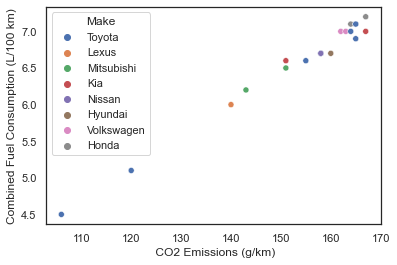

In [27]:
a = df3.sort_values(by = 'CO2 Emissions').head(20)
sns.scatterplot(data=a, x="CO2 Emissions", y="Fuel_Consumption_Comb", hue="Make").set(ylabel = 'Combined Fuel Consumption (L/100 km)', xlabel =' CO2 Emissions (g/km)')

- **Toyota Corolla Hybrid** is the least polluting vehicle within the *Compact* vehicles segment. 
- Amongst the 20 least polluting cars in this segment, **Toyota** manufactures the most number of vehicles. 

[Text(0.5, 0, 'Smog Rating')]

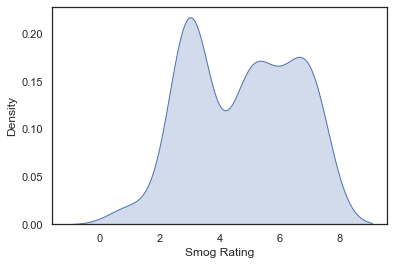

In [28]:
sns.kdeplot(data = df3, x= 'Smog_Rating', shade = True).set(xlabel = 'Smog Rating')

- **SUV : Small**

In [29]:
df4 = df1.loc[lambda x:x['Vehicle Class'] == 'SUV: Small']
df4.loc[lambda x:x['CO2 Emissions'] == df4['CO2 Emissions'].min() ]

,Model_Year,Make,Model_Name,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
292,2020,Ford,Escape Hybrid,SUV: Small,2.5,4.0,AV,X,5.4,6.3,5.8,136.0,9,7


[Text(0, 0.5, 'Combined Fuel Consumption (L/100 km)'),
 Text(0.5, 0, ' CO2 Emissions (g/km)')]

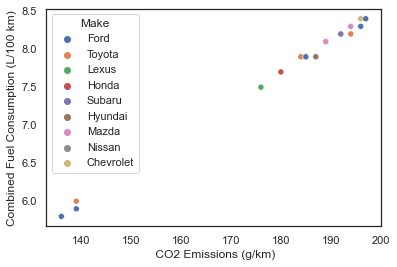

In [30]:
b = df4.sort_values(by = 'CO2 Emissions').head(20)
sns.scatterplot(data=b, x="CO2 Emissions", y="Fuel_Consumption_Comb", hue="Make").set(ylabel = 'Combined Fuel Consumption (L/100 km)', xlabel =' CO2 Emissions (g/km)')

- **Ford Escape Hybrid** is the least polluting vehicle within the *SUV: Small* vehicles segment. 
- Amongst the 20 least polluting cars in this segment, **Ford** manufactures the most number of vehicles. 

[Text(0.5, 0, 'Smog Rating')]

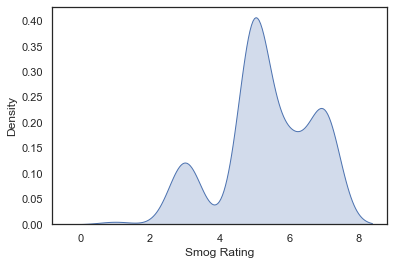

In [31]:
sns.kdeplot(data = df4, x= 'Smog_Rating', shade = True).set(xlabel = 'Smog Rating')

- **Mid-size**

In [32]:
df5 = df1.loc[lambda x:x['Vehicle Class'] == 'Mid-size']
df5.loc[lambda x:x['CO2 Emissions'] == df5['CO2 Emissions'].min() ]

,Model_Year,Make,Model_Name,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
847,2020,Toyota,Prius,Mid-size,1.8,4.0,AV,X,4.4,4.7,4.5,106.0,10,7


[Text(0, 0.5, 'Combined Fuel Consumption (L/100 km)'),
 Text(0.5, 0, ' CO2 Emissions (g/km)')]

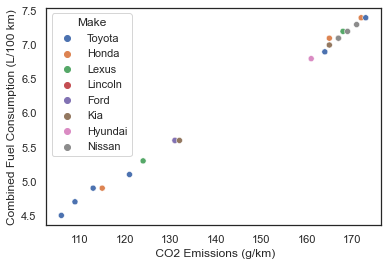

In [33]:
c = df5.sort_values(by = 'CO2 Emissions').head(20)
sns.scatterplot(data=c, x="CO2 Emissions", y="Fuel_Consumption_Comb", hue="Make").set(ylabel = 'Combined Fuel Consumption (L/100 km)', xlabel =' CO2 Emissions (g/km)')

- **Toyota Prius** is the least polluting vehicle within the *Mid-size* vehicles segment. 
- Amongst the 20 least polluting cars in this segment, **Toyota** manufactures the most number of vehicles. 

[Text(0.5, 0, 'Smog Rating')]

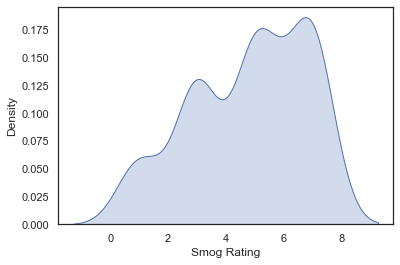

In [34]:
sns.kdeplot(data = df5, x= 'Smog_Rating', shade = True).set(xlabel = 'Smog Rating')

- **Subcompact**

In [35]:
df6 = df1.loc[lambda x:x['Vehicle Class'] == 'Subcompact']
df6.loc[lambda x:x['CO2 Emissions'] == df6['CO2 Emissions'].min()]

,Model_Year,Make,Model_Name,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
229,2020,Chevrolet,Spark,Subcompact,1.4,4.0,AV,X,7.9,6.2,7.1,167.0,7,5


[Text(0, 0.5, 'Combined Fuel Consumption (L/100 km)'),
 Text(0.5, 0, ' CO2 Emissions (g/km)')]

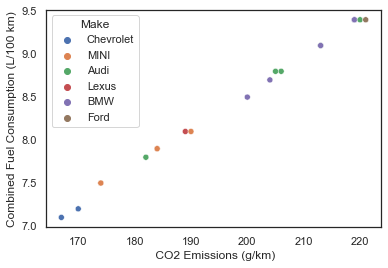

In [36]:
d = df6.sort_values(by = 'CO2 Emissions').head(20)
sns.scatterplot(data=d, x="CO2 Emissions", y="Fuel_Consumption_Comb", hue="Make").set(ylabel = 'Combined Fuel Consumption (L/100 km)', xlabel =' CO2 Emissions (g/km)')

- **Chevrolet Spark** is the least polluting vehicle within the *Subcompact* vehicles segment. 
- Amongst the 20 least polluting cars in this segment, **BMW** manufactures the most number of vehicles. 

[Text(0.5, 0, 'Smog Rating')]

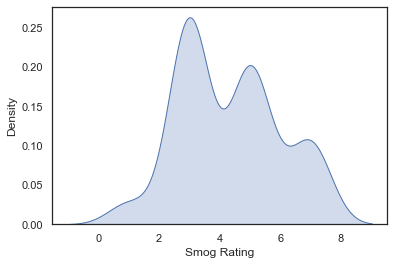

In [37]:
sns.kdeplot(data = df6, x= 'Smog_Rating', shade = True).set(xlabel = 'Smog Rating')

- **Full-size**

In [38]:
df7 = df1.loc[lambda x:x['Vehicle Class'] == 'Full-size']
df7.loc[lambda x:x['CO2 Emissions'] == df7['CO2 Emissions'].min() ]

,Model_Year,Make,Model_Name,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
456,2020,Hyundai,IONIQ Blue,Full-size,1.6,4.0,AM6,X,4.2,4.0,4.1,96.0,10,7


[Text(0, 0.5, 'Combined Fuel Consumption (L/100 km)'),
 Text(0.5, 0, ' CO2 Emissions (g/km)')]

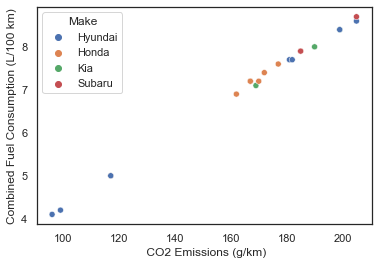

In [39]:
e = df7.sort_values(by = 'CO2 Emissions').head(20)
sns.scatterplot(data=e, x="CO2 Emissions", y="Fuel_Consumption_Comb", hue="Make").set(ylabel = 'Combined Fuel Consumption (L/100 km)', xlabel =' CO2 Emissions (g/km)')

- **Hyundai IONIQ Blue** is the least polluting vehicle within the *Full-size* vehicles segment. 
- Amongst the 20 least polluting cars in this segment, **Hyundai** manufactures the most number of vehicles. 

[Text(0.5, 0, 'Smog Rating')]

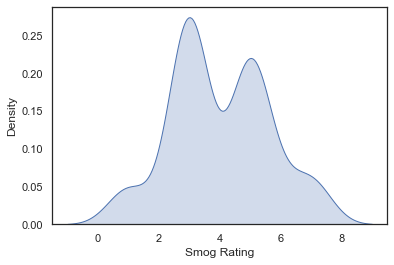

In [40]:
sns.kdeplot(data = df7, x= 'Smog_Rating', shade = True).set(xlabel = 'Smog Rating')


- **SUV: Standard**

In [41]:
df8 = df1.loc[lambda x:x['Vehicle Class'] == 'SUV: Standard']
df8.loc[lambda x:x['CO2 Emissions'] == df8['CO2 Emissions'].min()]

,Model_Year,Make,Model_Name,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
846,2020,Toyota,Highlander Hybrid AWD Limited/Platinum,SUV: Standard,2.5,4.0,AV,X,6.6,6.8,6.7,156.0,8,7


[Text(0, 0.5, 'Combined Fuel Consumption (L/100 km)'),
 Text(0.5, 0, ' CO2 Emissions (g/km)')]

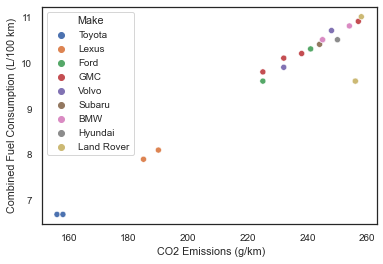

In [42]:
sns.set_theme(font_scale = 0.9, style="white")
f = df8.sort_values(by = 'CO2 Emissions').head(20)
sns.scatterplot(data=f, x="CO2 Emissions", y="Fuel_Consumption_Comb", hue="Make").set(ylabel = 'Combined Fuel Consumption (L/100 km)', xlabel =' CO2 Emissions (g/km)')

- **Toyota Highlander Hybrid AWD Limited/Platinum** is the least polluting vehicle within the *SUV: Standard* vehicles segment. 
- Amongst the 20 least polluting cars in this segment, **GMC** manufactures the most number of vehicles. 

[Text(0.5, 0, 'Smog Rating')]

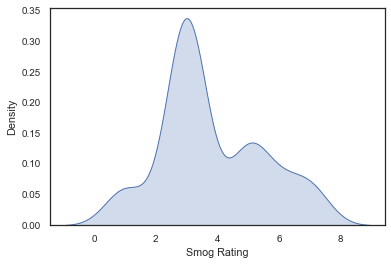

In [43]:
sns.kdeplot(data = df8, x= 'Smog_Rating', shade = True).set(xlabel = 'Smog Rating')

- **Pickup truck: Standard**

In [44]:
df9= df1.loc[lambda x:x['Vehicle Class'] == 'Pickup truck: Standard']
df9.loc[lambda x:x['CO2 Emissions'] == df9['CO2 Emissions'].min() ]

,Model_Year,Make,Model_Name,Vehicle Class,Engine Size,Cylinders,Transmission,Fuel,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,CO2 Emissions,CO2_Rating,Smog_Rating
208,2020,Chevrolet,Silverado,Pickup truck: Standard,3.0,6.0,A10,D,10.2,7.2,8.9,238.0,5,1


[Text(0, 0.5, 'Combined Fuel Consumption (L/100 km)'),
 Text(0.5, 0, ' CO2 Emissions (g/km)')]

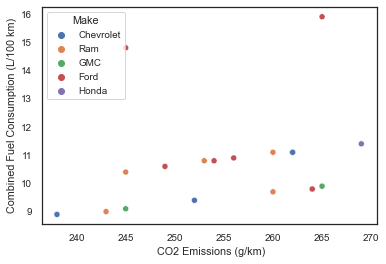

In [45]:
g= df9.sort_values(by = 'CO2 Emissions').head(20)
sns.scatterplot(data=g, x="CO2 Emissions", y="Fuel_Consumption_Comb", hue="Make").set(ylabel = 'Combined Fuel Consumption (L/100 km)', xlabel =' CO2 Emissions (g/km)')

- **Chevrolet Silverado** is the least polluting vehicle within the *Pickup Truck: Standard* vehicles segment. 
- Amongst the 20 least polluting cars in this segment, **Ford** manufactures the most number of vehicles. 

**Vehicle Make v/s Carbon Emssions**

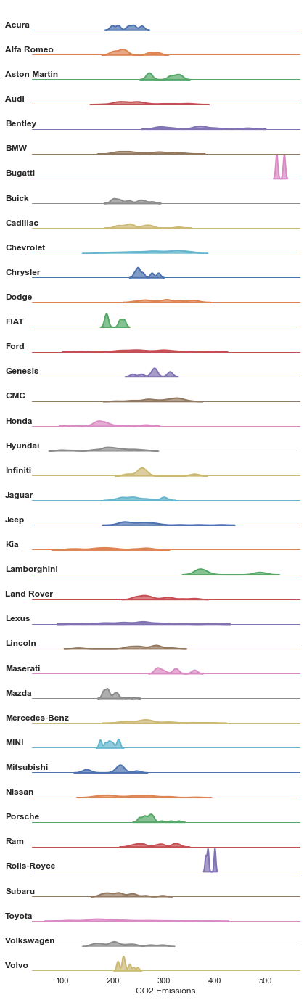

In [63]:
sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Initialize the FacetGrid object
g = sns.FacetGrid(df1, row="Make", hue="Make", aspect= 12, height=0.5 , palette = 'deep')

# Draw the densities in a few steps
g.map(sns.kdeplot, "CO2 Emissions", clip_on=False, shade=True, alpha=0.7, lw=2, bw_method=.2)
g.map(plt.axhline, y=0, lw=1, clip_on=False)

# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(-0.1, .2, label, ha="left", va="center", fontweight="bold", transform=ax.transAxes, fontsize = 12)
g.map(label, "CO2 Emissions")

# Set the subplots to overlap
g.fig.subplots_adjust(hspace= -0.01)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[])
g.despine(bottom=True, left=True)


**Vehicle Class v/s Carbon Emssions**

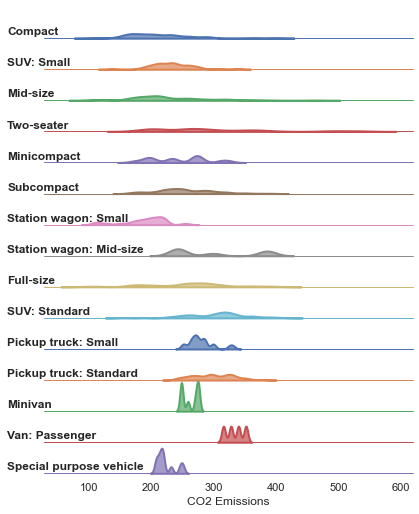

In [64]:
sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Initialize the FacetGrid object
g = sns.FacetGrid(df1, row="Vehicle Class", hue="Vehicle Class", aspect= 12, height=0.5 , palette = 'deep')

# Draw the densities in a few steps
g.map(sns.kdeplot, "CO2 Emissions", clip_on=False, shade=True, alpha=0.7, lw=2, bw_method=.2)
g.map(plt.axhline, y=0, lw=1, clip_on=False)

# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(-0.1, .2, label, ha="left", va="center", fontweight="bold", transform=ax.transAxes, fontsize = 12)
g.map(label, "CO2 Emissions")

# Set the subplots to overlap
g.fig.subplots_adjust(hspace= -0.01)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[])
g.despine(bottom=True, left=True)


### 2. Identifying the factors that most affect the Fuel Consumption of vehicles: ###

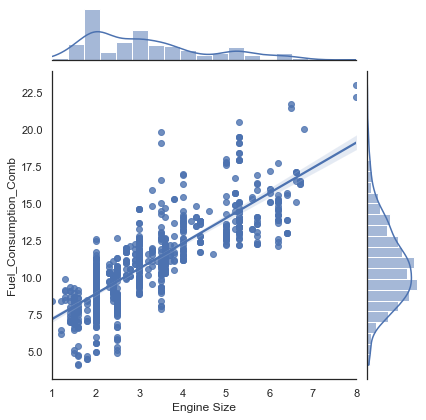

In [47]:
sns.set_theme(font_scale = 1, style="white")
sns.jointplot(x = 'Engine Size', y = 'Fuel_Consumption_Comb', data = df1, kind = 'reg')

In [48]:
df1['Engine Size'].corr(df1['Fuel_Consumption_Comb'])

0.8266719270002312

- There is a significant positive correlation betweeen the *engine size* and *fuel consumption*. Hence, fuel consumption increases with engine size. 
- Therefore, vehicles such as pick up trucks, SUVs and sports cars have high fuel consumption.


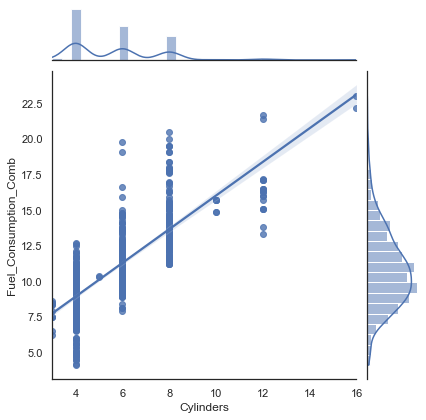

In [49]:
sns.jointplot(x = 'Cylinders', y = 'Fuel_Consumption_Comb', data = df1, kind ='reg')

In [50]:
df1['Cylinders'].corr(df1['Fuel_Consumption_Comb'])


0.812608152478695

- There is a significant positive correlation betweeen the *number of cylinders* and *fuel consumption*. 
- The *fuel consumption* increases with an increase in the number of *cylinders*.

[Text(0, 0.5, 'Combined Fuel Consumption (L/100 km)'),
 Text(0.5, 0, 'CO2 Rating')]

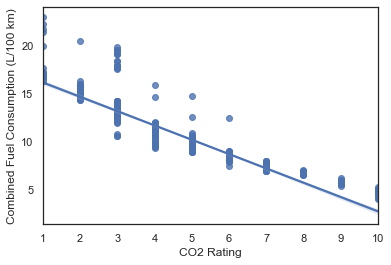

In [51]:
sns.regplot(x = 'CO2_Rating', y = 'Fuel_Consumption_Comb', data = df1).set(ylabel = "Combined Fuel Consumption (L/100 km)", xlabel = 'CO2 Rating')

In [52]:
df1['CO2_Rating'].corr(df1['Fuel_Consumption_Comb'])

-0.909868748778336

- The CO2 rating shows a strong negative correlation with Fuel Consumption.
- Hence, the CO2 rating depends on the fuel consumption. 
- High CO2 rating would mean a lower fuel consumption.

### 3. Does the Smog Rating depend on the CO2 Rating? ###

<AxesSubplot:xlabel='Smog Rating', ylabel='CO2 Rating'>

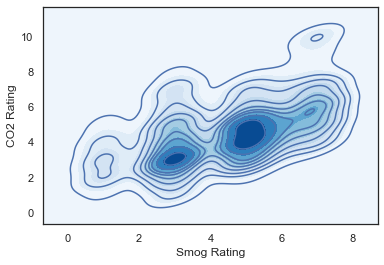

In [53]:
sns.kdeplot(data = df1, x= 'Smog_Rating', y = 'CO2_Rating').set(xlabel = 'Smog Rating', ylabel = "CO2 Rating")
 
sns.kdeplot(data = df1, x= 'Smog_Rating', y = 'CO2_Rating', cmap="Reds", shade=True, bw_method=.15)
 
sns.kdeplot(data = df1, x= 'Smog_Rating', y = 'CO2_Rating', cmap="Blues", shade=True, thresh=0, )

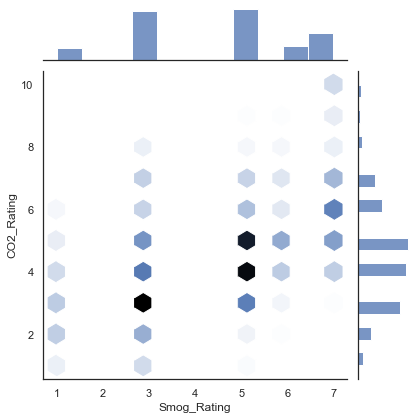

In [54]:
# Your Solution here 
sns.jointplot(data = df1, x = 'Smog_Rating', y='CO2_Rating', kind = 'hex')

In [55]:
df1['CO2_Rating'].corr(df1['Smog_Rating'])

0.5258077465277229

- The CO2 rating shows a weak positive correlation with Smog Rating.
- Hence, smog rating does not depend on the CO2 Rating. 
- Since smog rating considers other polluting gases such as SOx and NOx as well. 